# Assignment 3
### Cameron Smith

### Setup

In [46]:
!pip install daft==0.1.2
!mkdir gif_img/

mkdir: cannot create directory ‘gif_img/’: File exists


In [47]:
import daft
from matplotlib import rc
import scipy.stats as stats
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import Image
import imageio
import os
import requests
import os
import logging
import pickle
import pystan as stan

## Question 1

We have parameters:
$$\mathbf{\Theta} = \{m, b, Q, \mu_0, \lambda\}\,,$$
where $m, b, Q, \mu_0, \lambda$ directly affect each of the observed values $y_{i}$, with the scattering parameter $\lambda$ also affecting the observed values $x_{i}$. $m$ also affects each $x_i$, albeit indirectly through the scattering. The errors in each datapoint, $\sigma_{x,i}$ and $\sigma_{y,i}$ directly effect the corresoponding datapoint, while the cross correlation $\rho_{x, y, i}$ affects both $x_i$ and $y_i$.


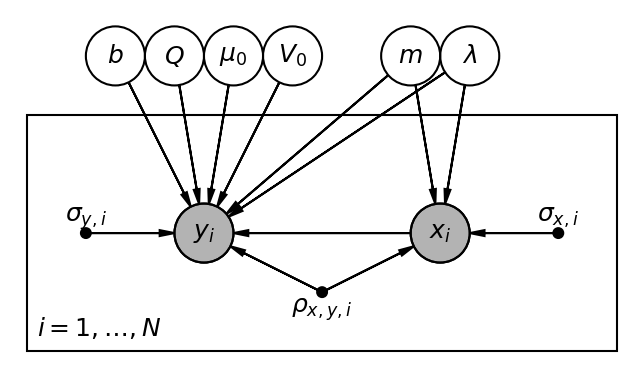

In [48]:
rc("font", family="serif", size=12)
rc("text", usetex=False)

pgm = daft.PGM(dpi=150)

# fixed parameters
pgm.add_node("rho", r"$\rho_{x,y,i}$", 3, -0.5, fixed=True, offset=(0, -15))
pgm.add_node("y_sigma", r"$\sigma_{y,i}$", 1, 0, fixed=True)
pgm.add_node("x_sigma", r"$\sigma_{x,i}$", 5, 0, fixed=True)

# observed parameters
pgm.add_node("y_obs", r"$y_i$", 2, 0, observed=True)
pgm.add_node("x_obs", r"$x_i$", 4, 0, observed=True)


# Variable parameters
pgm.add_node("m", r"$m$", 3.75, 1.5)
pgm.add_node("b", r"$b$", 1.25, 1.5)
pgm.add_node("Q", r"$Q$", 1.75, 1.5)
pgm.add_node("mu", r"$\mu_0$", 2.25, 1.5)
pgm.add_node("V", r"$V_0$", 2.75, 1.5)
pgm.add_node("lambda", r"$\lambda$", 4.25, 1.5)

# plate
pgm.add_plate([0.5, -1, 5, 2], label=r"$i=1,\ldots,N$")

# edges
pgm.add_edge("x_sigma", "x_obs")
pgm.add_edge("y_sigma", "y_obs")
pgm.add_edge("rho", "x_obs")
pgm.add_edge("rho", "y_obs")
pgm.add_edge("x_obs", "y_obs")

pgm.add_edge("m", "y_obs")
pgm.add_edge("m", "x_obs")
pgm.add_edge("b", "y_obs")
pgm.add_edge("lambda", "x_obs")
pgm.add_edge("lambda", "y_obs")
pgm.add_edge("Q", "y_obs")
pgm.add_edge("mu", "y_obs")
pgm.add_edge("V", "y_obs")
pgm.render();


## Question 2

First, let's generate the data:

In [49]:
np.random.seed(2)
K = 5
N = 1000

# get pi's
pi = np.random.multinomial(N, [1/K]*K)/1000


def generate_random_data(pi):
  # array size
  s = np.int(pi*N)
  mu_t = np.random.uniform(0, 100)
  sigma_t = np.random.uniform(0, 5)
  print(f"Dataset has {s} data points x~N({mu_t},{sigma_t})")
  
  return np.random.normal(mu_t, sigma_t, size=s)

data = list([generate_random_data(p) for p in pi]);

Dataset has 216 data points x~N(29.965467367452312,1.3341363755143332)
Dataset has 206 data points x~N(60.89301489343916,4.166062450613021)
Dataset has 200 data points x~N(10.274927548709478,2.3715255787737473)
Dataset has 183 data points x~N(25.85324447932127,2.2311861259993373)
Dataset has 195 data points x~N(14.515563049754965,1.9778674573688133)


Plotting the data, we find:

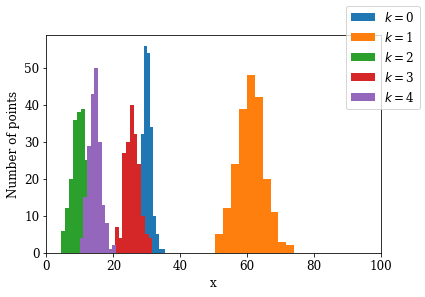

In [50]:
fig, ax = plt.subplots()
for k in range(K):
  ax.hist(data[k], label=rf"$k=${k}")
ax.set_ylabel("Number of points")
ax.set_xlabel("x")
ax.set_xlim(0, 100)
fig.legend();

Our model is therefore:
$$
x_{k, i} \sim \mathcal{N}(\mu_k, \sigma_k)
$$
For $k \in \{0, 1, 2, 3, 4\}$.
We marginalise over k, by introducing parameters $\pi_k$ which represent the prior probability of a datapoint belonging to the model $k$, i.e.
$$
p(k) = \pi_k \,,
$$
where
$$
\pi_k \sim \text{Multinomial}(K)\,.
$$

We use the following random guess for our parameters:

In [51]:
# initial guess
mu = np.arange(0, 100, 20)
sigma = np.array([5, 5, 5, 5, 5])
pi = np.array([0.2, 0.2, 0.2, 0.2, 0.2])
w = (1/K) * np.random.multinomial(K, np.ones(K)/K, size=N)

Plotting this, we get:

In [52]:
def plot_gaussian(ax, mu, sigma, pi):
  x = np.linspace(0, 100, 500)
  ax.plot(x, N*pi*stats.norm.pdf(x, mu, sigma))

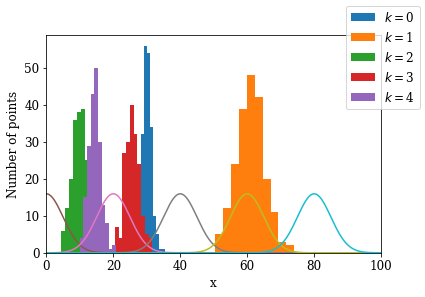

In [53]:
for k in range(K):
  plot_gaussian(ax, mu[k], sigma[k], pi[k])
fig

We have:
$$
p(x_i|k, \sigma_{k}, \mu_k) \propto p(k |x, \sigma_{k}, \mu_k) p(x_i|\sigma_{k}, \mu_k) \,
$$
but
$$
p(k |x_i, \sigma_{k}, \mu_k) = p(k) = \pi_k \, ,
$$
and so
$$
p(x_i|k, \sigma_{k}, \mu_k) \propto \pi_{k} \frac{1}{\sqrt{2\pi\sigma_{k}^2}}\exp\left(-\frac{\left[x_i - \mu_k\right]^2}{2\sigma_{k}^2}\right) \, .
$$
Normalising this probability with respect to each model $k$, we get membership probability given by:
$$
p(k=k|x_i, \sigma_{k}, \mu_k)  = \frac{\pi_k p(x_i|k, \sigma_{k}, \mu_k)}{\sum_{m=1}^{K}\pi_mp(x_i|k, \sigma_{k}, \mu_k)}
$$

Calculating this given our initial guess for each datapoint $n$ and model $k$, we get the following $N$ by $K$ matrix:

In [54]:
all_data = np.concatenate(data)

In [55]:
# membership probabilities
def prob_mem(x, pi, ivar, mu):
  # ignoring constant factors (since we divide by the total)
  prob = pi * np.sqrt(ivar) * np.exp(-0.5*ivar*(x-mu)**2)
  return prob  

def expectation(data, pi, mu, sigma):
  # calculate inverse variance:
  ivar = 1/sigma**2
  # matrix containing probabilities of membership
  mem_matrix = np.zeros((N,K))
  for i in range(K):
    p_k = prob_mem(data, pi[i], ivar[i], mu[i])
    mem_matrix[:,i] = p_k

  # compute pi matrix:
  # sum along rows to get sum of membership prob per data point
  sum_k = np.sum(mem_matrix, axis=1)
  # prob membership
  w = mem_matrix/sum_k[:, np.newaxis]

  return w

In [56]:
new_w = expectation(all_data, pi, mu, sigma)

We now update our model parameters based on this membership probability.

The expected number of datapoints described by model $k$ is clearly:
$$
N_k = \sum^{N}w_{nk}
$$

Our new value for $\pi_k$ is then the fraction of data points in model $k$:
$$
\pi_k^{\mathrm{(new)}} = \frac{N_k}{N}
$$

The mean value of each model is then the mean of the datapoints, weighted with respect to the probability of the each model being a member of the model:
$$
\mu_k^{\mathrm{(new)}} = \frac{1}{N_k}\sum_{n=1}^{N} w_{nk}x_n
$$

Similarly weigting the variance, we get:
$$\sigma_k^{2 \ \mathrm{(new)}} = \frac{1}{N_k}\sum_{n=1}^{N}w_{nk}\left(x_n-\mu_k^\mathrm{(new)}\right)^2
$$
We can simply take the square root of the variance to get the new standard deviation.

Implementing this, we get:

In [57]:
def maximisation(data, w):
  # number of data points in kth mixture
  N_k = np.sum(w, axis=0)

  # calculate new parameters:
  new_pi = N_k/N
  new_mu = np.zeros(K)
  new_sigma = np.zeros(K)
  for k in range(K):
    new_mu[k] = np.dot(w[:, k], data)/N_k[k]
    new_sigma[k] = np.sqrt(np.dot(w[:, k], (data - new_mu[k])**2)/N_k[k])
  return new_pi, new_mu, new_sigma

In [58]:
new_pi, new_mu, new_sigma = maximisation(all_data, new_w)

In [59]:
print(f"Our new estimates for pi are: {*new_pi,}.")
print(f"Our new estimates for mu are: {*new_mu,}.")
print(f"Our new estimates for sigma are: {*new_sigma,}.")

Our new estimates for pi are: (0.11383158332614296, 0.5575305588129597, 0.12439937266943757, 0.19778832714521286, 0.006450158046246518).
Our new estimates for mu are: (8.921726320348982, 20.166045906508867, 30.6684437545674, 60.803256091893424, 69.78640581067735).
Our new estimates for sigma are: (2.1918126495941115, 7.186944594676164, 3.0543778390975893, 3.794726829600401, 2.86243148756482).


Plotting this, we get:

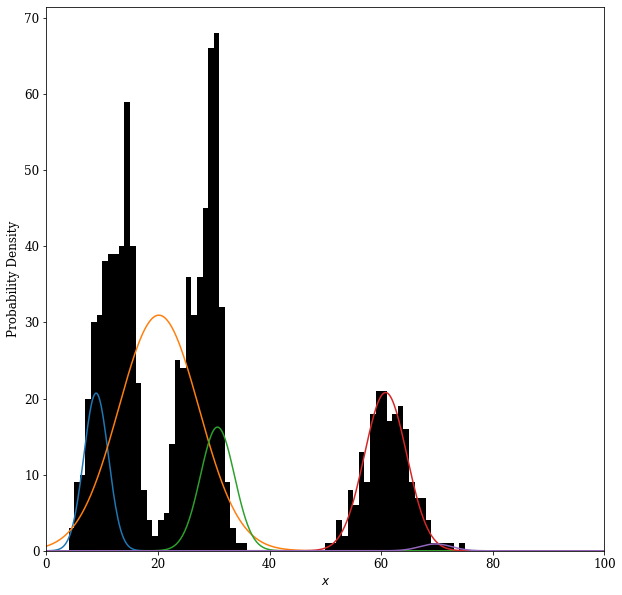

In [60]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_xlim(0, 100)
ax.hist(all_data, label="Data", color="k", range=(0, 100), bins=100)
for k in range(K):
  plot_gaussian(ax, new_mu[k], new_sigma[k], new_pi[k])
ax.set_xlabel(r"$x$")
ax.set_ylabel(r"Probability Density");


## Question 3

In [16]:
# reset the initial guess
mu = np.arange(0, 100, 20)
sigma = np.array([5, 5, 5, 5, 5])
pi = np.array([0.2, 0.2, 0.2, 0.2, 0.2])
w = (1/K) * np.random.multinomial(K, np.ones(K)/K, size=N)

The Likelihood is given by:

$$
\newcommand\vectheta{\boldsymbol{\theta}}
      \newcommand\vecdata{\mathbf{y}}
      \newcommand\model{\boldsymbol{\mathcal{M}}}
      \newcommand\vecx{\boldsymbol{x}}
      \renewcommand{\vec}[1]{\boldsymbol{#1}}
\begin{array}\\
\mathcal{L} &=&  \prod_{i=1}^{N} p(x_i|\vectheta) \\
  &=&  \prod_{i=1}^{N}\sum_{k=1}^{K}\pi_{k}p(x_i|\theta_k) \\
  &=&  \prod_{i=1}^{N}\sum_{k=1}^{K}\pi_{k} \frac{1}{\sqrt{2\pi\sigma_{k}^2}}\exp\left(-\frac{\left[x_i - \mu_k\right]^2}{2\sigma_{k}^2}\right)
 \end{array}
$$

Taking the log of this, we get:

$$
\log{\mathcal{L}} = \sum_{i=1}^{N}\log \left[\sum_{k=1}^{K}\pi_{k} \frac{1}{\sqrt{2\pi\sigma_{k}^2}}\exp\left(-\frac{\left[x_i - \mu_k\right]^2}{2\sigma_{k}^2}\right)\right]
$$

Implementing this, we get:

In [17]:
def ln_likelihood(data, pi, mu, sigma):
  ivar = 1/sigma**2
  ll = 0
  for x in data:
    ll += np.log(np.sum(pi * np.sqrt(ivar) * np.exp(-0.5*ivar*(mu - x)**2)))
  return ll

Alternating between the two steps, we get the following:

In [18]:
theta_list = []
w_list = []
for _ in range(100):
  new_w = expectation(all_data, new_pi, new_mu, new_sigma)
  new_pi, new_mu, new_sigma = maximisation(all_data, new_w)
  theta_list.append((new_pi, new_mu, new_sigma))
  w_list.append(w)

Now make plots:

In [19]:
ll_list = []
for i in range(100):
  w = w_list[i]
  pi, mu, sigma = theta_list[i]

  # add log likelihood to list
  ll_list.append(ln_likelihood(all_data, pi, mu, sigma))

  # setup figure
  fig, axs = plt.subplots(1, 2, figsize=(20, 10))

  # plot probability density
  axs[0].set_xlim(0, 100)
  axs[0].hist(all_data, label="Data", color="k", range=(0, 100), bins=100)
  for k in range(K):
    plot_gaussian(axs[0], mu[k], sigma[k], pi[k])
  axs[0].set_ylabel('Probability Density')
  axs[0].set_xlabel(r'$x$')

  # plot log-likelihood
  axs[1].plot(ll_list, c="k")
  axs[1].set_xlim(0, 100)
  axs[1].set_xlabel(r'$Iterations$')
  axs[1].set_ylabel(r'$\log \mathcal{l}$')

  ax.legend()
  fig.savefig(f'gif_img/gif_{i:0>3}.png');
  plt.close();

And Combine into a gif:

In [20]:
images = []
for filename in np.sort(os.listdir('gif_img/')):
    images.append(imageio.imread(f'gif_img/{filename}'))
imageio.mimsave('my_gif.gif', images)

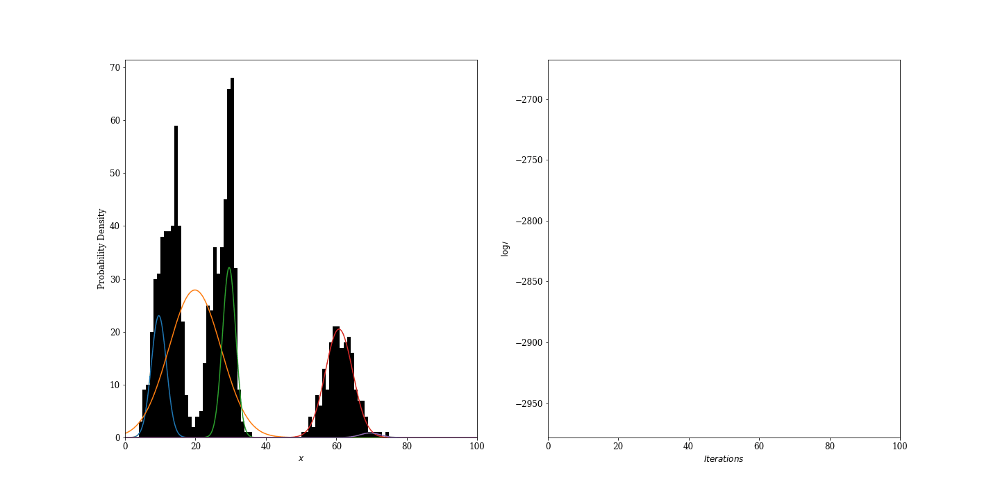

In [21]:
Image(open('my_gif.gif','rb').read())


Pretty sick. Doesn't actually converge on the true solution, but does pretty well considering there's a lot of overlap, and get's 4 out of 5 (by the end of the gif)

## Question 4

### Part A

First we download and format the data:

In [22]:
# download data
url = 'http://astrowizici.st/teaching/phs5000/temperatures.txt'
r = requests.get(url, stream=True)

# Check if the image was retrieved successfully
while r.status_code != 200:
  pass

r.raw.decode_content = True

In [23]:
# convert to array
data = r.text
data = data.split('\r\n\r\n')[:-1]
data = [series.split(' ') for series in data]
data = np.array(data).astype(float)

Plotting this, we get:

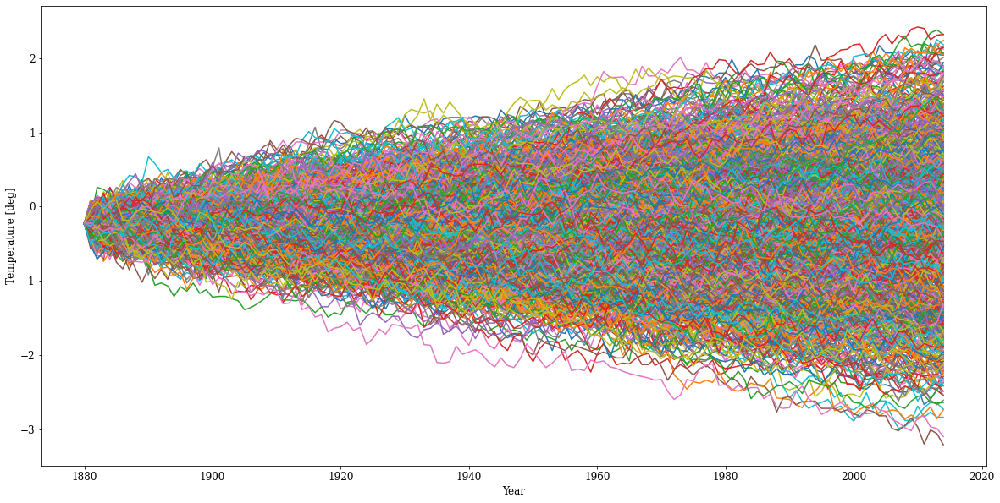

In [24]:
fig, ax = plt.subplots(figsize=(20, 10))

t = np.arange(1880, 2015)
for series in data:
  ax.plot(t, series)
ax.set_xlabel('Year')
ax.set_ylabel(r"Temperature [deg]");

### Part B

- We have a time series with Homoscedastic noise
- Each point depends on the previous point
- the Data is generated from a mixture of three models, one with no trend, one with a $+ 1^\circ/$ century trend, and one with a  $-1^\circ/$ century trend

$1^\circ/$ century is equivalent to $0.01^\circ/$ year, and so each series is specified by the model:

$$
y_{n, i} \sim \begin{cases}
      \mathcal{N}(y_{n, i-1} -10^{-2},\sigma) & \textrm{if } k = 0 \\
      \mathcal{N}(y_{n, i-1} + 10^{-2},\sigma) & \textrm{if } k = 1 \\
      \mathcal{N}(y_{n, i-1},\sigma) & \textrm{if } k = 2 \, ,
      \end{cases} 
$$
Where parameter $k$ specifiys the model and $y_{n, i}$ is the tempreture according to series $n$ at year $i$. Note since the noise is homoscedastic, $\sigma$ is the same across all the data.

We marginalise over k, by introducing parameters $\theta_k$ which represent the prior probability of a datapoint belonging to the model $k$, i.e.
$$
p(k) = \theta_k \,,
$$
where
$$
\theta_k \sim \text{Multinomial}(K)\,.
$$

### Part C

We now implement this model in stan:

In [25]:
# utils
def sampling_kwds(**kwargs):
    r"""
    Prepare a dictionary that can be passed to Stan at the sampling stage.
    Basically this just prepares the initial positions so that they match the
    number of chains.
    """

    kwds = dict(chains=4)
    kwds.update(kwargs)

    if "init" in kwds:
        kwds["init"] = [kwds["init"]] * kwds["chains"]

    return kwds

In [26]:
model_filename = "model.stan"
model_str = """
data {
    // number of series
    int<lower=1> N_series;

    // number of years
    int<lower=1> N_years;

    // Data Matrix
    matrix[N_series,N_years] data_points;

    //Year
    vector[N_years] year;

}

parameters {
    // standard deviation
    real<lower=0> sigma;

    // multinomial
    simplex[3] theta; 
}

model {
    for (n in 1:N_series) {
        for (m in 1:N_years) {
            real log_ps[3];
            log_ps[1] = log(theta[1]) + normal_lpdf(data_points[n, m] | -year[m]/100, sigma);
            log_ps[2] = log(theta[2]) + normal_lpdf(data_points[n, m] | +year[m]/100, sigma);
            log_ps[3] = log(theta[3]) + normal_lpdf(data_points[n, m] | 0.0, sigma);
            target += log_sum_exp(log_ps);
        }
    }
}

"""
model = stan.StanModel(model_code=model_str)

INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_46ab58e0f18b1fec427b14e4fb733ace NOW.


Now load in the data, and optimise:

In [28]:
N_years = 135
N_series = 1000
year = np.arange(0, N_years)

# Data.
data_dict = dict(
  N_years=N_years,
  N_series=N_series,
  data_points=data,
  year=year
)


init_dict = dict(
    sigma=0.1,
    theta=[0.2, 0.2, 0.6]
)

# Run optimisation.
opt_stan = model.optimizing(
    data=data_dict,
    init=init_dict
)

Finally, sample the posterior:

In [29]:
# Run sampling.
samples = model.sampling(**sampling_kwds(
    chains=2,
    iter=2000,
    data=data_dict,
    init=opt_stan
))

Get chains, and remove burn in:

In [30]:
theta_chains = samples["theta"][1000:].T
sigma_chain = samples["sigma"][1000:]

Plotting our chains for parameters $\theta_k$

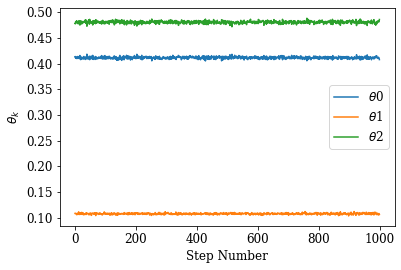

In [31]:
fig, ax = plt.subplots()
for i in range(3):
  ax.plot(theta_chains[i], label=rf'$\theta${i}')
ax.legend()
ax.set_xlabel("Step Number")
ax.set_ylabel(r"$\theta_k$");

Which gives us the following posterior:

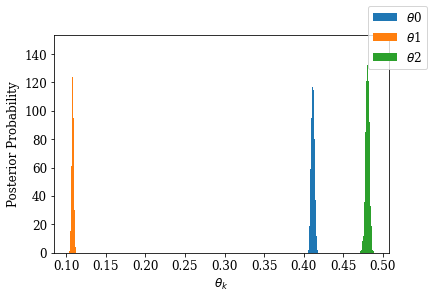

In [32]:
fig, ax = plt.subplots()
for i in range(3):
  ax.hist(theta_chains[i], bins=20, label=rf'$\theta${i}')
fig.legend()
ax.set_ylabel("Posterior Probability")
ax.set_xlabel(r"$\theta_k$");

Doing the same for parameter $\sigma$, we get:

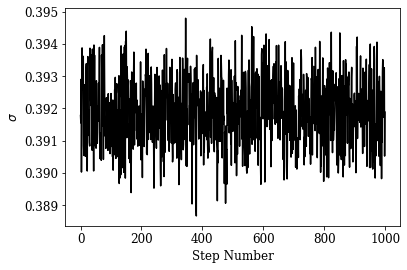

In [33]:
fig, ax = plt.subplots()
ax.plot(sigma_chain, c='k')
ax.set_xlabel("Step Number")
ax.set_ylabel(r"$\sigma$");

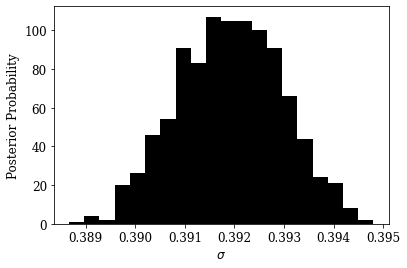

In [34]:
fig, ax = plt.subplots()
ax.hist(sigma_chain, bins=20, color='k');
ax.set_ylabel("Posterior Probability")
ax.set_xlabel(r"$\sigma$");

From these posterior distributions, we calculate the percentiles to give us a mean and standard deviation:

In [35]:
q = [50, 2.5, 16, 84, 97.5]
print("model\t mean \tsd      2.5th p    16th p     84th p     97.5th p")
theta_mu = []
theta_sigma = []
for k in range(3):
  p = np.percentile(theta_chains[k], q)
  # percentage difference from mean
  diff = p - p[0]
  # standard deviation (middle 68% is ~1sd either way)
  sd = (diff[3] - diff[2])/2
  # add mean and sd to lists
  theta_mu.append(p[0])
  theta_sigma.append(sd)
  print(f'theta {k}\t {p[0]:.3}  {sd:.1}  {p[1:]}')
p = np.percentile(sigma_chain, q)
# percentage difference from mean
diff = p - p[0]
# standard deviation (middle 68% is ~1sd either way)
sigma = (diff[3] - diff[2])/2
print(f'sigma \t {p[0]:.3}  {sd:.1}  {p[1:]}')

model	 mean 	sd      2.5th p    16th p     84th p     97.5th p
theta 0	 0.411  0.002  [0.40764915 0.40928204 0.41358502 0.41549665]
theta 1	 0.108  0.001  [0.10543918 0.10674214 0.10918545 0.11033141]
theta 2	 0.481  0.002  [0.47588006 0.47819797 0.48283314 0.48511745]
sigma 	 0.392  0.002  [0.38987966 0.39083031 0.39297956 0.39392793]


### Part D

For each model k, we have
$$
P(y_{k, i}| k, \sigma) = \frac{1}{\sqrt{2\pi\sigma^2}}\exp\left(-\frac{\left[y_{k, i} - y_{k, i-1}\right]^2}{2\sigma^2}\right) \quad .
$$

Taking the product of this this over the 135 years, then taking the log (converting the sum to a product), we get log likelihood:

In [36]:
i_var = 1/sigma**2
def ln_likelihood(series, k):
  # get trend
  if k == 0:
    trend = -1/100
  elif k==1:
    trend = 1/100
  else:
    trend = 0
  # take initial year as true:
  last_year = series[0]
  # log likelihood
  ll = 0
  for t in range(1, 135):
    year = series[t]
    ll += -0.5*np.log(2 * np.pi * i_var ) - 0.5*(year - (last_year + trend))**2 * i_var
    last_year = year
  return ll


For model k, our prior is precisely the value of $\theta_k$, i.e. the probability that the series comes from model k. Therefore we get log prior:

In [37]:
# convert our list to np array:
theta_mu = np.array(theta_mu)

def ln_prior(k):
  return np.log(theta_mu[k])

And so the log posterior ($\propto$ log likelihood $+$ log prior) is given by:

In [38]:
def ln_posterior(series, k):
  ll = ln_likelihood(series, k)
  lp = ln_prior(k)
  return ll + lp

In [39]:
posteriors = np.zeros(shape=(1000, 3))
for s in range(1000):
  for k in range(3):
    series = data[s]
    ln_post = ln_posterior(series, k)
    posteriors[s, k] = ln_post

### Part E

Get model with highest membership for each posterior:

In [40]:
highest_membership = np.argmax(posteriors, axis=1)

To check if these are at all reasonable, plot the series in each catogry:

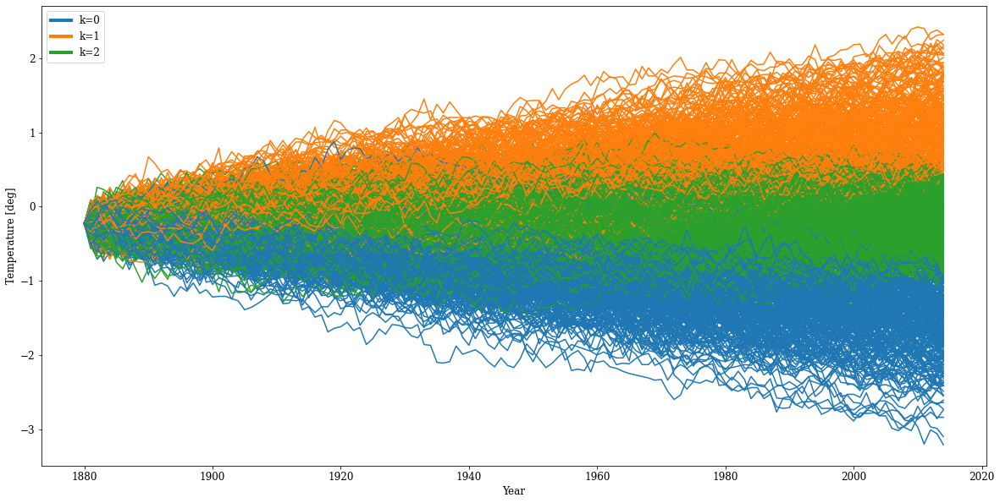

In [41]:
fig, ax = plt.subplots(figsize=(20, 10))

t = np.arange(1880, 2015)
cmap = ['tab:blue', 'tab:orange', 'tab:green']
for i in range(1000):
  series = data[i]
  k = highest_membership[i]
  ax.plot(t, series, c=cmap[k])
ax.set_xlabel('Year')
ax.set_ylabel(r"Temperature [deg]");
# legend stuff
from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color=cmap[0], lw=4),
                Line2D([0], [0], color=cmap[1], lw=4),
                Line2D([0], [0], color=cmap[2], lw=4)]
ax.legend(custom_lines, [r'k=0', r'k=1', r'k=2']);

Which looks pretty reasonable.

Now, let's calculate the highest membership probabilities for each series:

In [42]:
highest_prob = np.zeros(1000)
for i in range(1000):
  # log posteriors:
  lposts = posteriors[i]
  # index of highest memebership:
  k = highest_membership[i]
  # log prob of membership:
  log_prob = lposts[k] - np.logaddexp.reduce(lposts)
  highest_prob[i] = np.exp(log_prob)


Expectation is then:

In [43]:
expectation = 0
for i in range(1000):
  expectation += highest_prob[i]
expectation

998.7104697538227

So we have apparently calculated $\sim 999/1000$ series correctly. This looks too good to be true, I suspect we have some rounding errors in our favour since the highest prob is mostly filled with 1's.

Our uncertainty on this number is:

In [44]:
var_correct = 0
for i in range(1000):
  max_p = highest_prob[i]
  var_correct += max_p * (1-max_p)
sd_correct = np.sqrt(var_correct)
sd_correct

0.892550164893651

Yeah, this also looks too good to be true. According to this, the our expected number of correctly calculated series is:
$$
998.7 \pm 0.9
$$

### Part F

log Probability that we identify above 900 is then:

In [45]:
from scipy.stats import norm
1 - norm(loc = expectation , scale = sd_correct).cdf(900)

1.0

So the probability is within rounding error of 1

So yes, we should take the bet. (Really, we are betting on me not making a mistake so far which is *definitely* not within the rounding error of 1).